In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")

from sklearn.metrics import confusion_matrix, accuracy_score, ConfusionMatrixDisplay

import os
from os import walk

In [2]:
classes = {"buildings":0,"forest":1,"glacier":2, "mountain":3, "sea":4, "street":5}
dir_pred = "D:/Downloads/CNN/seg_pred/seg_pred"
dir_test = "D:/Downloads/CNN//seg_test/seg_test"
dir_train =  "D:/Downloads/CNN//seg_train/seg_train"

In [3]:
# read in the names of the images in the prediction set
(dirpath_pred, dirnames_pred, fnames_pred) = next(walk(dir_pred))
print("Size of the prediction set is {}".format(len(fnames_pred)))

Size of the prediction set is 7301


In [4]:
def read_image_names_class(dpath):
    fnames = {}
    x, dirnames, y = next(walk(dpath))
    for d in dirnames:
        _,_,temp = next(walk(os.path.join(dpath,d)))
        fnames[classes[d]] = temp        
    
    return dirnames, fnames

def check_class_imbalance(fnames):
    count = 0
    class_summary = {}
    for key,value in fnames.items():
        count = count + len(value)
        class_summary[key] = len(value)
        
    summary = pd.DataFrame.from_dict(class_summary, orient='index', columns=["Count"])  
    summary['CumCount'] = np.cumsum(summary['Count']) 
    summary['Class'] = summary.index
    summary['Class'] = summary['Class'].apply(class_from_key)
    
    return summary

def class_from_key(x):
    for key, value in classes.items():
        if x == value:
            return key
        
def sample_images_from_class(nsample, classname, path, fnames):
    sind = np.random.random_integers(1,len(fnames[classes[classname]]),nsample)
    spath = [os.path.join(path, classname, fnames[classes[classname]][i]) for i in sind]
    
    return spath

def plot_sampled_images(path, fnames):
    nsample = 3
    ncols = len(classes)
    
    fig, ax = plt.subplots(nsample, ncols, figsize=(20, 3*nsample))
    
    for i,cl in enumerate(classes.keys()):
        sp = sample_images_from_class(nsample, cl, path, fnames)
        for j,spj in enumerate(sp):            
            img = mpimg.imread(spj)
            ax[j,i].imshow(img)
            ax[j,i].axis('off')
            ax[j,i].set_title(cl)   
            
def plot_sampled_prediction_images(path, fnames):    
    nsample = 3
    ncols = len(classes)
    
    fig, ax = plt.subplots(nsample, ncols, figsize=(20, 3*nsample))
    sind = np.random.random_integers(1,len(fnames), nsample*ncols)
    
    axs = ax.ravel()
    for i, sp in enumerate(sind):
        spj = os.path.join(path, fnames[sp])
        img = mpimg.imread(spj)
        axs[i].imshow(img)
        axs[i].axis('off')
    
def get_true_pred(model, ds):
    y = model.predict(ds)

    ytrue = []
    ypred = []

    ypred.append(np.argmax(y,axis=1))
    for img, lbl in ds:
        for l in lbl:
            ytrue.append(np.argmax(l.numpy()))    
    
    return ytrue, ypred

def plot_confMat(ytrue, ypred):
    cm = confusion_matrix(y_true = ytrue,y_pred = ypred[0])
    cmd = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=[class_from_key(x) for x in range(6)])
    cmd.plot(include_values=True, cmap = plt.cm.Blues, ax=None)

    plt.title("Accuracy score is {:.2f}".format(accuracy_score(y_true = ytrue,y_pred = ypred[0])))

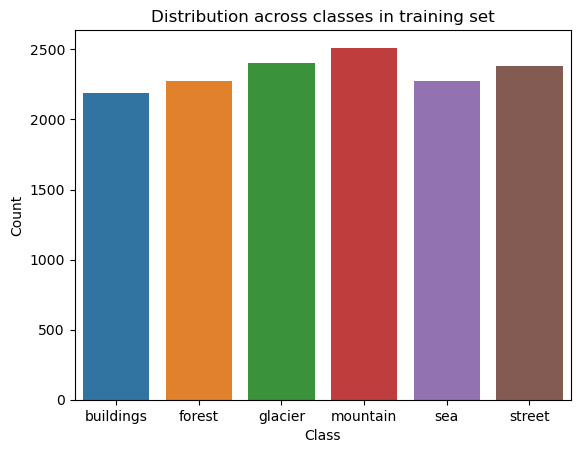

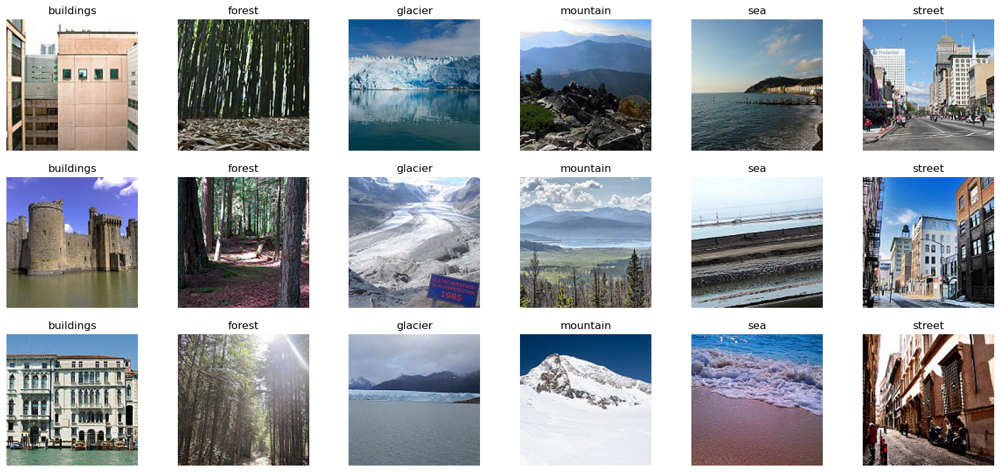

In [5]:
dirnames_train, fnames_train = read_image_names_class(dir_train)
train_summary = check_class_imbalance(fnames_train)
train_summary.head(10)
sns.barplot(data=train_summary, x = 'Class', y='Count').set_title("Distribution across classes in training set")
plot_sampled_images(dir_train, fnames_train)

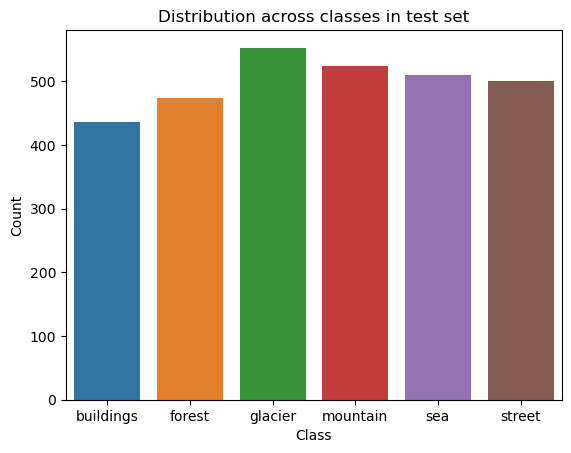

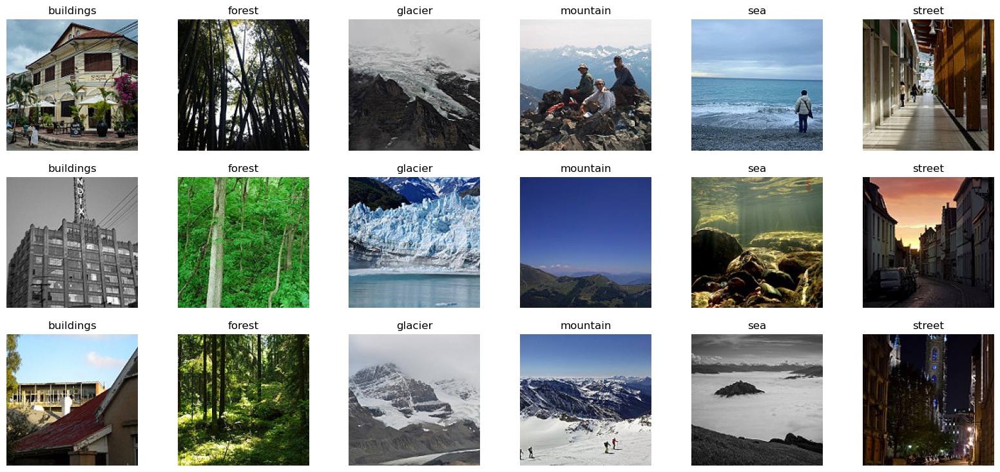

In [6]:
dirnames_test, fnames_test = read_image_names_class(dir_test)
test_summary = check_class_imbalance(fnames_test)
test_summary.head(10)

sns.barplot(data=test_summary, x = 'Class', y='Count').set_title("Distribution across classes in test set")

plot_sampled_images(dir_test, fnames_test)

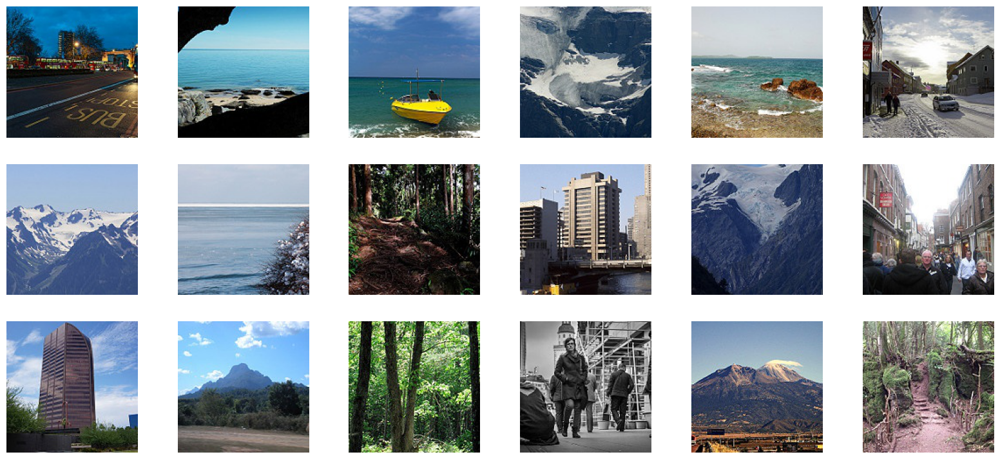

In [7]:
plot_sampled_prediction_images(dir_pred, fnames_pred)

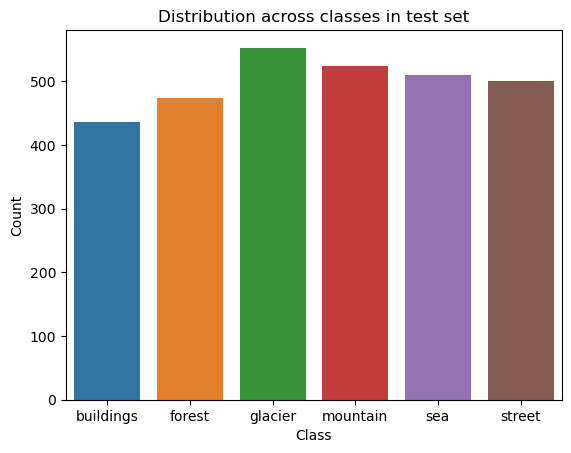

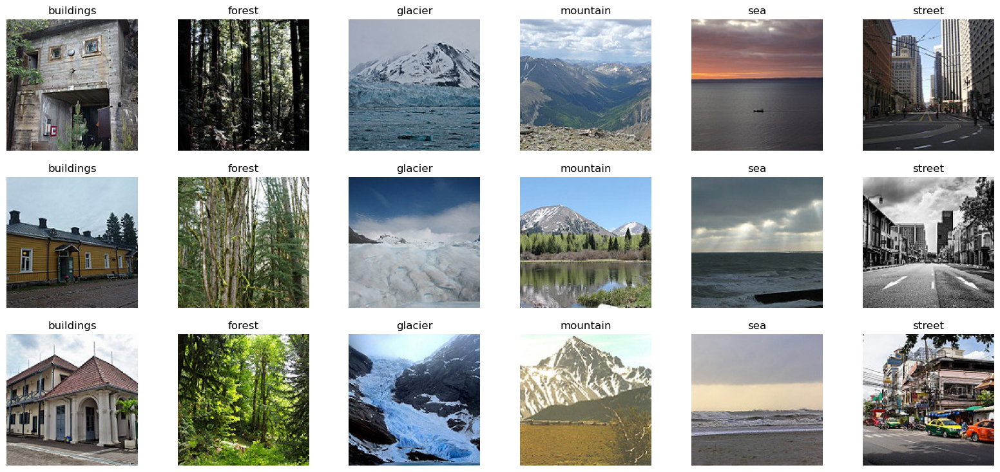

In [8]:
dirnames_test, fnames_test = read_image_names_class(dir_test)
test_summary = check_class_imbalance(fnames_test)
test_summary.head(10)

sns.barplot(data=test_summary, x = 'Class', y='Count').set_title("Distribution across classes in test set")

plot_sampled_images(dir_test, fnames_test)

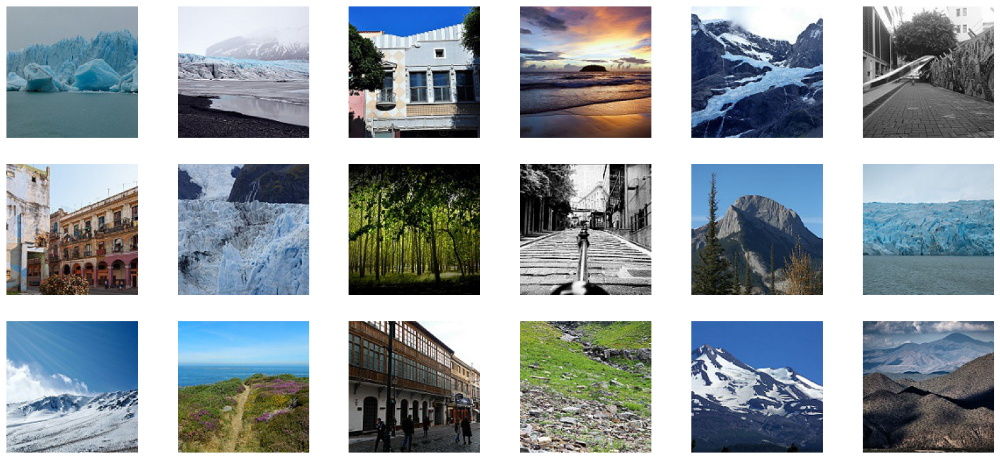

In [9]:
plot_sampled_prediction_images(dir_pred, fnames_pred)

In [10]:
import tensorflow as tf
tf.random.set_seed(0)

In [11]:
batch = 32
shuff = True
train_ds = tf.keras.preprocessing.image_dataset_from_directory(dir_train,
                                                               validation_split=0.2,  subset="training",
                                                               seed=0,  image_size=(150, 150),
                                                               batch_size=batch, shuffle= shuff, label_mode='categorical')
val_ds = tf.keras.preprocessing.image_dataset_from_directory(dir_train,
                                                               validation_split=0.2,  subset="validation",
                                                               seed=0,  image_size=(150, 150),
                                                               batch_size=batch, shuffle= shuff, label_mode='categorical')


Found 14034 files belonging to 6 classes.
Using 11228 files for training.
Found 14034 files belonging to 6 classes.
Using 2806 files for validation.


In [12]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [16]:
import tensorflow as tf

mod = tf.keras.models.Sequential([    
    tf.keras.layers.Rescaling(scale=1./255, input_shape=(150, 150, 3)),
    tf.keras.layers.RandomContrast(factor=0.2),
    tf.keras.layers.RandomFlip(mode="horizontal"),
    tf.keras.layers.RandomRotation(factor=0.05),
    tf.keras.layers.RandomTranslation(height_factor=0.2, width_factor=0.2),
    tf.keras.layers.RandomZoom(height_factor=(0.1, 0.3), width_factor=(0.1, 0.3)),
    tf.keras.layers.Conv2D(filters=16, kernel_size=(3,3), activation='relu', padding='same'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Conv2D(filters=12, kernel_size=(3,3), activation='relu', padding='same'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.2),    
    tf.keras.layers.MaxPooling2D(pool_size=(2,2)),
    tf.keras.layers.Conv2D(filters=12, kernel_size=(1,1), activation='relu', padding='same'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.2),    
    tf.keras.layers.MaxPooling2D(pool_size=(2,2)),
    tf.keras.layers.Conv2D(filters=16, kernel_size=(3,3), activation='relu', padding='same'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.2),   
    tf.keras.layers.MaxPooling2D(pool_size=(2,2)),
    tf.keras.layers.Conv2D(filters=16, kernel_size=(5,5), activation='relu', padding='same'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.2),      
    tf.keras.layers.MaxPooling2D(pool_size=(2,2)),
    tf.keras.layers.Conv2D(filters=16, kernel_size=(3,3), activation='relu', padding='same'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Conv2D(filters=16, kernel_size=(3,3), activation='relu', padding='same'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Conv2D(filters=16, kernel_size=(3,3), activation='relu', padding='same'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.2),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(units=256, activation='relu'),
    tf.keras.layers.Dense(units=128, activation='relu'),
    tf.keras.layers.Dense(units=6, activation='softmax')
])


In [17]:
mets = ['accuracy', tf.metrics.Precision(), tf.metrics.Recall(), 
        tf.metrics.TrueNegatives(), tf.metrics.TruePositives(), tf.metrics.FalseNegatives(), tf.metrics.FalsePositives()]
mod.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.01), 
            loss=tf.keras.losses.CategoricalCrossentropy(), metrics= mets)

In [18]:
earlystop = tf.keras.callbacks.EarlyStopping(patience=10, min_delta=1e-3, restore_best_weights=True)
lr = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', patience=3, verbose=1, factor=0.5, min_lr=1e-7)

# traindat_aug = tf.keras.preprocessing.image.ImageDataGenerator(rotation_range=10, width_shift_range=0.2, height_shift_range=0.2, 
#                                                           brightness_range=(-2.,2.), zoom_range=0.2, horizontal_flip=True, 
#                                                           rescale=1./255, validation_split=0.2)
# testdat_aug = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)


# train_ds = traindat_aug.flow_from_directory(dir_train, target_size=(150,150), batch_size=batch, class_mode='categorical', subset="training")
# valid_ds = traindat_aug.flow_from_directory(dir_train, target_size=(150,150), batch_size=batch, class_mode='categorical', subset="validation")
# test_ds = testdat_aug.flow_from_directory(dir_test, target_size=(150,150), batch_size=batch, class_mode='categorical')

# traindat_aug.fit(train_ds)


In [19]:
hist = mod.fit(train_ds, epochs=15, batch_size=batch, verbose=1, shuffle=shuff, validation_data=val_ds, callbacks=[earlystop, lr])

Epoch 1/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 314s 793ms/step - accuracy: 0.3865 - false_negatives_1: 4557.1333 - false_positives_1: 851.7159 - loss: 1.5878 - precision_1: 0.4934 - recall_1: 0.1604 - true_negatives_1: 27381.0117 - true_positives_1: 1089.4120 - val_accuracy: 0.3403 - val_false_negatives_1: 2076.0000 - val_false_positives_1: 973.0000 - val_loss: 1.9563 - val_precision_1: 0.4287 - val_recall_1: 0.2602 - val_true_negatives_1: 13057.0000 - val_true_positives_1: 730.0000 - learning_rate: 0.0100
Epoch 2/15
351/351 ━━━━━━━━━━━━━━━━━━━━ 290s 826ms/step - accuracy: 0.5476 - false_negatives_1: 3546.4829 - false_positives_1: 928.5341 - loss: 1.1451 - precision_1: 0.6893 - recall_1: 0.3678 - true_negatives_1: 27292.8867 - true_positives_1: 2097.8010 - val_accuracy: 0.3482 - val_false_negatives_1: 1945.0000 - val_false_positives_1: 1445.0000 - val_loss: 2.5982 - val_precision_1: 0.3734 - val_recall_1: 0.3068 - val_true_negatives_1: 12585.0000 - val_true_positives_1: 861.0000 - learning_ra

In [20]:
mod.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape              ┃    Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━┩
│ rescaling_1 (Rescaling)         │ (None, 150, 150, 3)       │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ random_contrast_1               │ (None, 150, 150, 3)       │          0 │
│ (RandomContrast)                │                           │            │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ random_flip_1 (RandomFlip)      │ (None, 150, 150, 3)       │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ random_rotation_1               │ (None, 150, 150, 3)       │          0 │
│ (RandomRotation)                │                           │            │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ random_translation_1            │ (None, 150, 150, 3)       │          0 │
│ (RandomTranslation)             │                           │            │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ random_zoom_1 (RandomZoom)      │ (None, 150, 150, 3)       │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ conv2d_7 (Conv2D)               │ (None, 150, 150, 16)      │        448 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ batch_normalization_7           │ (None, 150, 150, 16)      │         64 │
│ (BatchNormalization)            │                           │            │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ dropout_7 (Dropout)             │ (None, 150, 150, 16)      │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ conv2d_8 (Conv2D)               │ (None, 150, 150, 12)      │      1,740 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ batch_normalization_8           │ (None, 150, 150, 12)      │         48 │
│ (BatchNormalization)            │                           │            │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ dropout_8 (Dropout)             │ (None, 150, 150, 12)      │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 75, 75, 12)        │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ conv2d_9 (Conv2D)               │ (None, 75, 75, 12)        │        156 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ batch_normalization_9           │ (None, 75, 75, 12)        │         48 │
│ (BatchNormalization)            │                           │            │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ dropout_9 (Dropout)             │ (None, 75, 75, 12)        │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 37, 37, 12)        │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ conv2d_10 (Conv2D)              │ (None, 37, 37, 16)        │      1,744 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ batch_normalization_10          │ (None, 37, 37, 16)        │         64 │
│ (BatchNormalization)            │                           │            │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ dropout_10 (Dropout)            │ (None, 37, 37, 16)        │          0 │
├─────────────────────────────────┼───────────────────────────┼────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 18, 18, 16)        │          0 │
├─────────────────────────────────┼───────────────────────────┼──────────

 Total params: 1,150,460 (4.39 MB)

 Trainable params: 383,406 (1.46 MB)

 Non-trainable params: 240 (960.00 B)

 Optimizer params: 766,814 (2.93 MB)

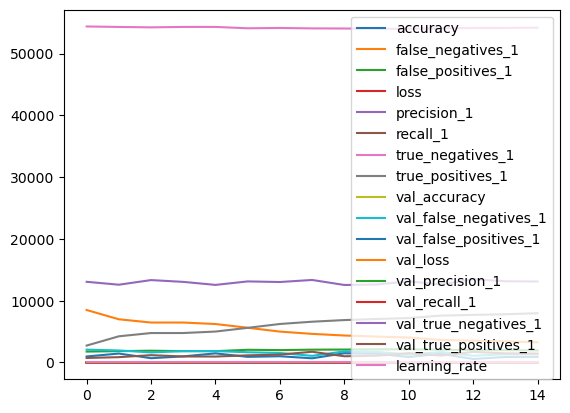

In [21]:
for key in hist.history.keys():
    plt.plot(hist.history[key],label=key)
plt.legend()
# plt.ylim([0,1])

In [22]:
mod.evaluate(train_ds)

351/351 ━━━━━━━━━━━━━━━━━━━━ 62s 177ms/step - accuracy: 0.6681 - false_negatives_1: 2151.9033 - false_positives_1: 1381.8239 - loss: 0.8747 - precision_1: 0.7132 - recall_1: 0.6129 - true_negatives_1: 26838.6875 - true_positives_1: 3492.1990


[0.8568230271339417,
 0.6747417449951172,
 4252.0,
 2733.0,
 0.7185086011886597,
 0.6213038563728333,
 53407.0,
 6976.0]

In [23]:
mod.evaluate(val_ds)

88/88 ━━━━━━━━━━━━━━━━━━━━ 15s 170ms/step - accuracy: 0.6711 - false_negatives_1: 544.4269 - false_positives_1: 342.6180 - loss: 0.8925 - precision_1: 0.7228 - recall_1: 0.6199 - true_negatives_1: 6854.4604 - true_positives_1: 894.9888


[0.894910454750061,
 0.6732003092765808,
 1072.0,
 676.0,
 0.7195020914077759,
 0.6179615259170532,
 13354.0,
 1734.0]

Found 3000 files belonging to 6 classes.
94/94 ━━━━━━━━━━━━━━━━━━━━ 22s 203ms/step
94/94 ━━━━━━━━━━━━━━━━━━━━ 18s 189ms/step - accuracy: 0.6855 - false_negatives_1: 585.4631 - false_positives_1: 372.9263 - loss: 0.9526 - precision_1: 0.7253 - recall_1: 0.6110 - true_negatives_1: 7304.5474 - true_positives_1: 950.0316


[0.8771154284477234,
 0.6796666383743286,
 1134.0,
 742.0,
 0.7154908180236816,
 0.621999979019165,
 14258.0,
 1866.0]

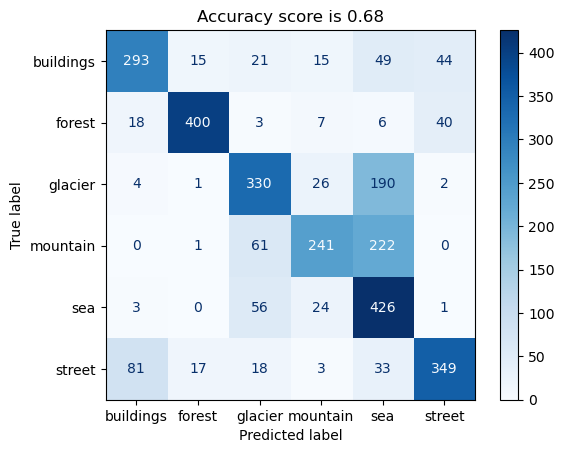

In [24]:
test_ds = tf.keras.preprocessing.image_dataset_from_directory(dir_test, seed=0,  image_size=(150, 150),
                                                               batch_size=batch, shuffle= False, label_mode='categorical')
# y_test = mod.predict(test_ds)
# tf.keras.utils.to_categorical(np.argmax(y_test,axis=1))
y_true, y_pred = get_true_pred(mod, test_ds)
plot_confMat(y_true, y_pred)

mod.evaluate(test_ds)

In [25]:
mod.save("D:/Downloads/CNN/model_ep15.keras") 

In [26]:
loaded_model = tf.keras.models.load_model("D:/Downloads/CNN/model_ep15.keras")

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step


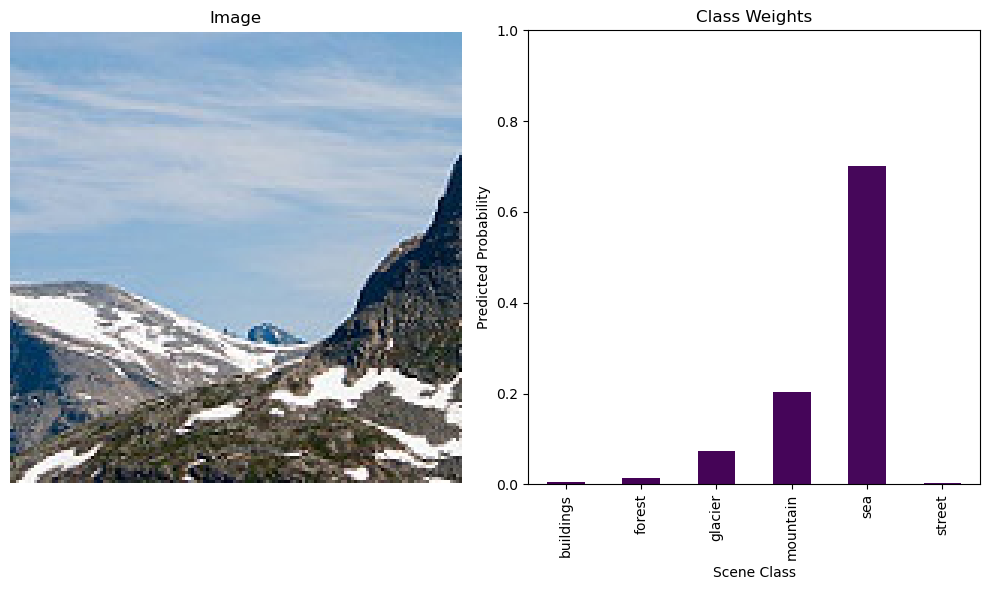

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


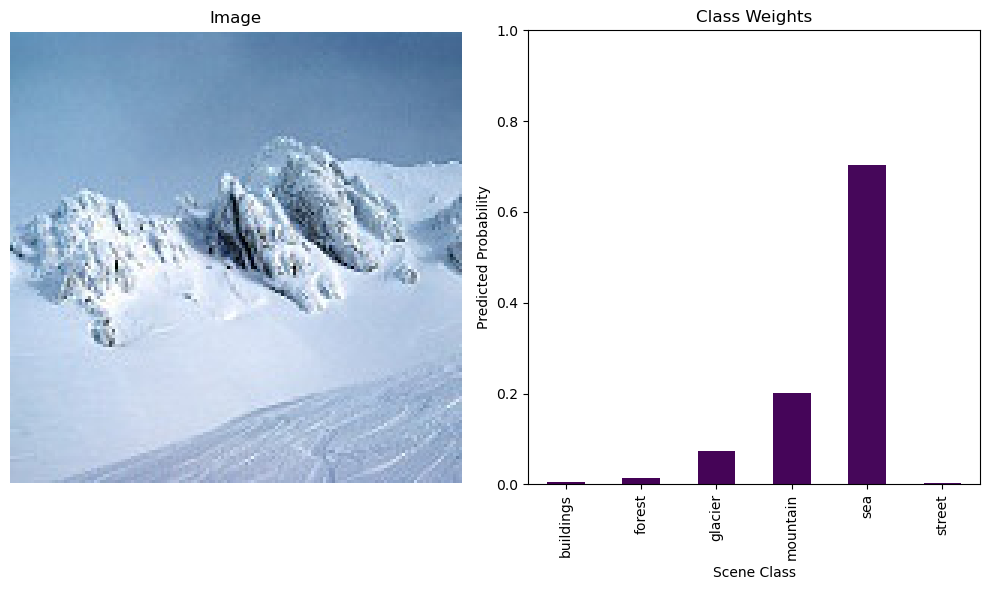

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


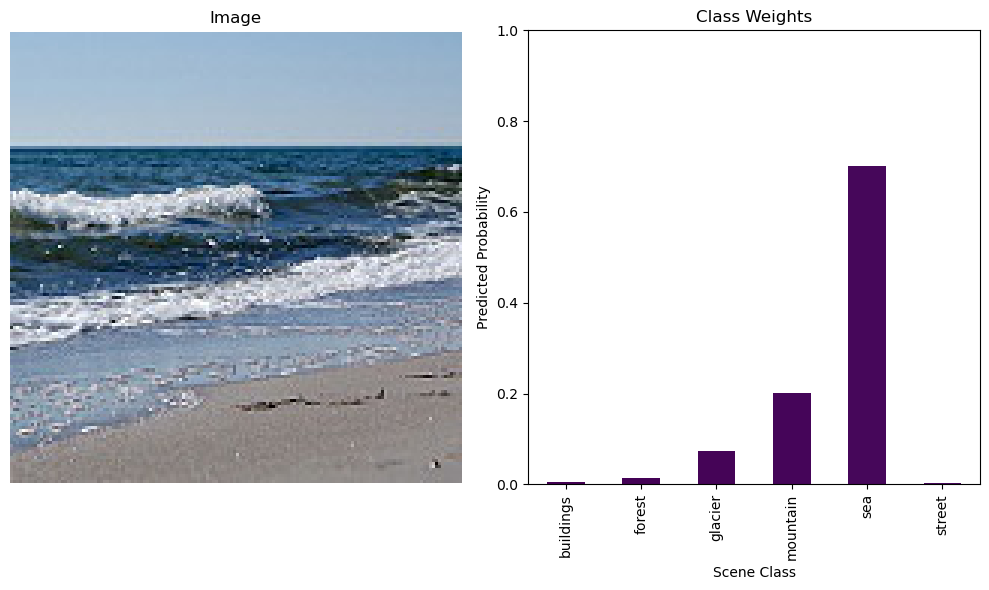

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step


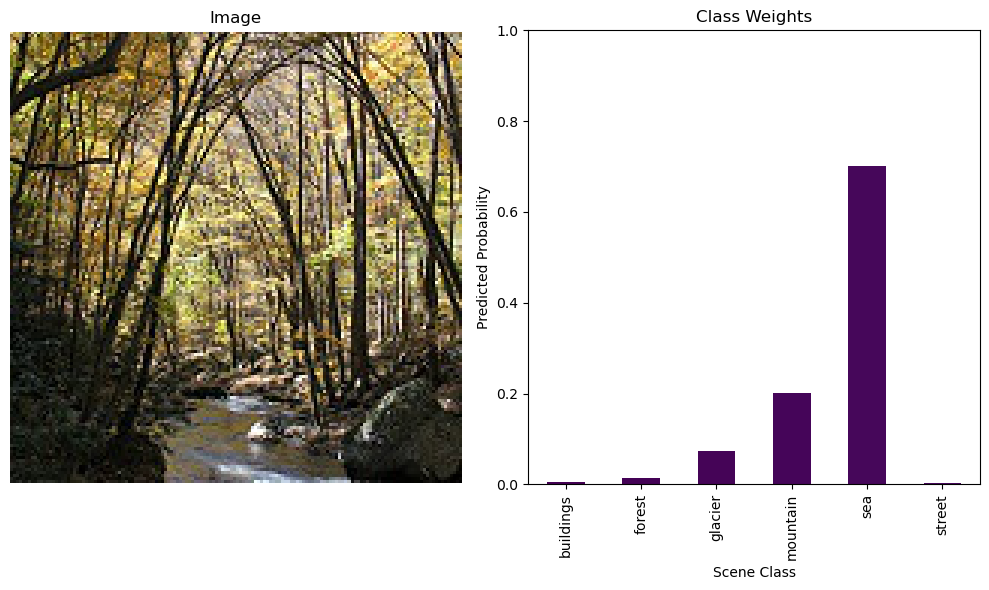

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


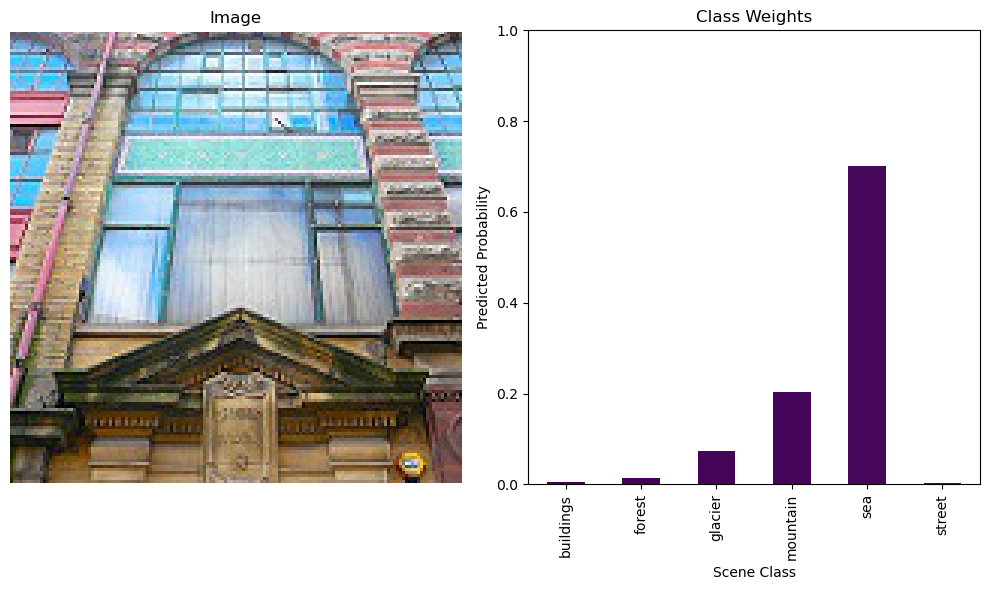

In [34]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf

# Define class names and directory paths
classes = {"buildings": 0, "forest": 1, "glacier": 2, "mountain": 3, "sea": 4, "street": 5}
dir_pred = "D:/Downloads/CNN/seg_pred/seg_pred"

# Import the trained model
model = tf.keras.models.load_model("D:/Downloads/CNN/model_ep15.keras")

# Randomly select 5 images from the prediction directory
import random
fnames_pred = os.listdir(dir_pred)
random.shuffle(fnames_pred)
selected_images = fnames_pred[:5]

# Function to predict and plot class weights for an image
def predict_and_plot_weights(image_path):
  # Read the image
  img = tf.keras.preprocessing.image.load_img(image_path, target_size=(150, 150))
  img_array = tf.keras.preprocessing.image.img_to_array(img)
  img_array = tf.expand_dims(img_array, axis=0) / 255.0

  # Get prediction and class weights
  prediction = model.predict(img_array)[0]
  class_weights = pd.Series(prediction, index=classes.keys())

  # Plot image and bar chart
  plt.figure(figsize=(10, 6))
  plt.subplot(121)
  plt.imshow(img)
  plt.axis('off')
  plt.title("Image")

  plt.subplot(122)
  class_weights.plot(kind="bar", color=plt.cm.viridis.colors)
  plt.xlabel("Scene Class")
  plt.ylabel("Predicted Probability")
  plt.ylim(0, 1)
  plt.title("Class Weights")

  plt.tight_layout()
  plt.show()

# Predict and plot for each selected image
for image_path in selected_images:
  predict_and_plot_weights(os.path.join(dir_pred, image_path))



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 308ms/step


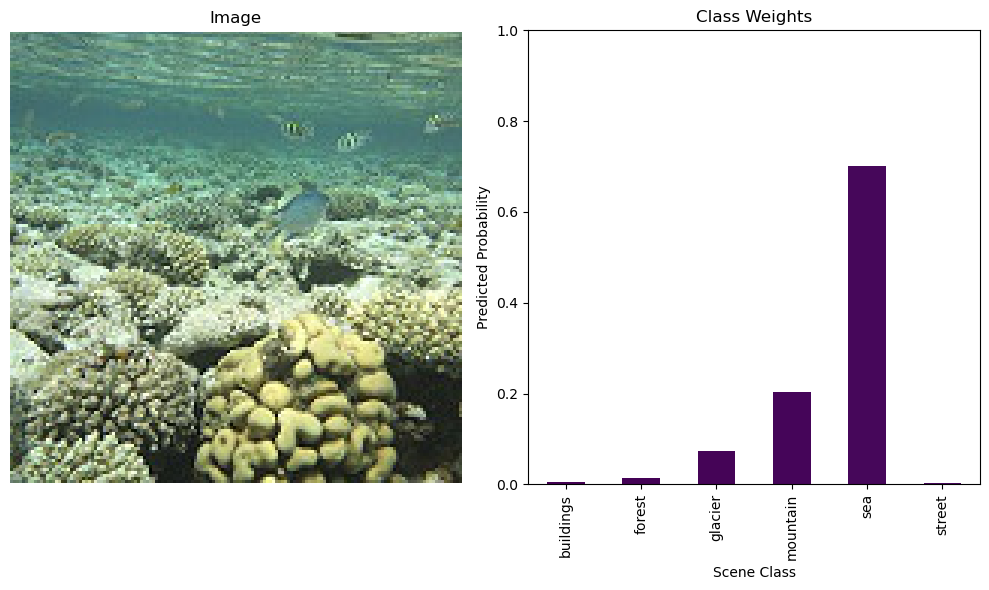

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


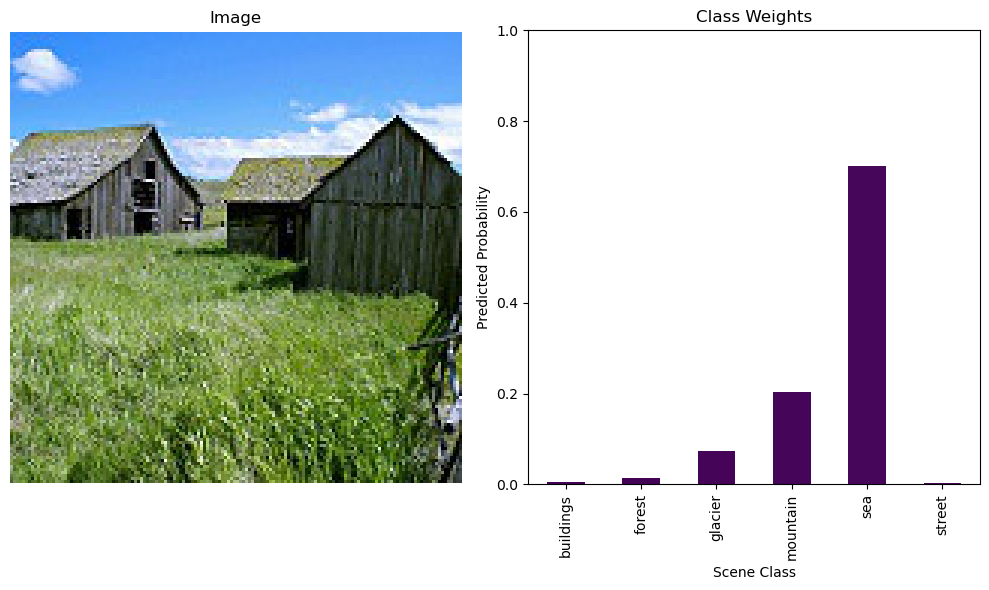

In [49]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import tensorflow as tf

# Define class names and directory paths
classes = {"buildings": 0, "forest": 1, "glacier": 2, "mountain": 3, "sea": 4, "street": 5}
dir_pred = "D:/Downloads/CNN/seg_pred/seg_pred"

# Import the trained model
model = tf.keras.models.load_model("D:/Downloads/CNN/model_ep15.keras")

# Randomly select 5 images from the prediction directory
import random
fnames_pred = os.listdir(dir_pred)
random.shuffle(fnames_pred)
selected_images = fnames_pred[:2]

# Function to predict and plot class weights for an image
def predict_and_plot_weights(image_path):
  # Read the image
  img = tf.keras.preprocessing.image.load_img(image_path, target_size=(150, 150))
  img_array = tf.keras.preprocessing.image.img_to_array(img)
  img_array = tf.expand_dims(img_array, axis=0) / 255.0

  # Get prediction and class weights
  prediction = model.predict(img_array)[0]
  class_weights = pd.Series(prediction, index=classes.keys())

  # Plot image and bar chart
  plt.figure(figsize=(10, 6))
  plt.subplot(121)
  plt.imshow(img)
  plt.axis('off')
  plt.title("Image")

  plt.subplot(122)
  class_weights.plot(kind="bar", color=plt.cm.viridis.colors)
  plt.xlabel("Scene Class")
  plt.ylabel("Predicted Probability")
  plt.ylim(0, 1)
  plt.title("Class Weights")

  plt.tight_layout()
  plt.show()

# Predict and plot for each selected image
for image_path in selected_images:
  predict_and_plot_weights(os.path.join(dir_pred, image_path))

